####**Get the data from Kaggle**

In [ ]:
!pip install -q opendatasets

In [ ]:
import opendatasets as od

In [ ]:
od.download('https://www.kaggle.com/competitions/optiver-trading-at-the-close') # insert ypu kaggle  username and key
# {"username":"######","key":"####################"}

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: roaamamoun
Your Kaggle Key: ··········


100%|██████████| 201M/201M [00:02<00:00, 73.3MB/s]



Extracting archive ./optiver-trading-at-the-close/optiver-trading-at-the-close.zip to ./optiver-trading-at-the-close


####**Importing All The Dependencies**

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.6 MB/s eta 0:00:00


In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import plotly.express as px
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error

###**Data Overview**

We have trading at the close data it have three phases order book, auction order book and combined book.
in order book its real time phase immediately matched the bid and ask.
in auction order book it is not immediately matched instead collected until the moment the auction ends.
the closing auction price called far price its provided 5 minutes befor closing cross.
in combined book its combined the two books the result more accurate.
in this phase the price called near price its provided 5 minutes befor closing.
the company also provides fair price called reference price calcculates as the near price bounded between best bid and best ask.

the problem is we want to predict the best price in this last 10 minutes.


**and the features for this data as following:**

***stock_id*** - A unique identifier for the stock. Not all stock IDs exist in every time bucket.

***date_id*** - A unique identifier for the date. Date IDs are sequential & consistent across all stocks.

***imbalance_size*** - The amount unmatched at the current reference price (in USD).

***imbalance_buy_sell_flag*** - An indicator reflecting the direction of auction imbalance.

- buy-side imbalance; 1

- sell-side imbalance; -1

- no imbalance; 0

***reference_price*** - The price at which paired shares are maximized, the imbalance is minimized and the distance from the bid-ask midpoint is minimized, in that order. Can also be thought of as being equal to the near price bounded between the best bid and ask price.

***matched_size*** - The amount that can be matched at the current reference price (in USD).

***far_price*** - The crossing price that will maximize the number of shares matched based on auction interest only. This calculation excludes continuous market orders.

***near_price*** - The crossing price that will maximize the number of shares matched based auction and continuous market orders.

***(bid/ask)_price*** - Price of the most competitive buy/sell level in the non-auction book.

***(bid/ask)_size***  - The dollar notional amount on the most competitive buy/sell level in the non-auction book.

***wap*** - The weighted average price in the non-auction book.

***seconds_in_bucket*** - The number of seconds elapsed since the beginning of the day's closing auction, always starting from 0.

***target*** - The 60 second future move in the wap of the stock, less the 60 second future move of the synthetic index. Only provided for the train set.


###**Load and explore train and test data files**

In [ ]:
df = pd.read_csv('/content/optiver-trading-at-the-close/train.csv')
df.head()

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
0,0,0,0,3180602.69,1,0.999812,13380276.64,NaN,NaN,0.999812,60651.50,1.000026,8493.03,1.0,-3.029704,0,0_0_0
1,1,0,0,166603.91,-1,0.999896,1642214.25,NaN,NaN,0.999896,3233.04,1.000660,20605.09,1.0,-5.519986,0,0_0_1
2,2,0,0,302879.87,-1,0.999561,1819368.03,NaN,NaN,0.999403,37956.00,1.000298,18995.00,1.0,-8.389950,0,0_0_2
3,3,0,0,11917682.27,-1,1.000171,18389745.62,NaN,NaN,0.999999,2324.90,1.000214,479032.40,1.0,-4.010200,0,0_0_3
4,4,0,0,447549.96,-1,0.999532,17860614.95,NaN,NaN,0.999394,16485.54,1.000016,434.10,1.0,-7.349849,0,0_0_4


In [ ]:
df.shape

(5237980, 17)

**our data have <font color='green'>5237980 </font>rows and <font color='green'>16 </font>features and the <font color='green'>target</font>** 🤏



In [ ]:
df.isna().sum()

stock_id                         0
date_id                          0
seconds_in_bucket                0
imbalance_size                 220
imbalance_buy_sell_flag          0
reference_price                220
matched_size                   220
far_price                  2894342
near_price                 2857180
bid_price                      220
bid_size                         0
ask_price                      220
ask_size                         0
wap                            220
target                          88
time_id                          0
row_id                           0
dtype: int64

**we notice that in <font color='green'>far_price</font>
 and <font color='green'>near_price</font> there are half of the records are null because the price information is provided  <mark style="background-color: yellow;">5 minutes before</mark> the closing cross** 😰




In [ ]:
df.duplicated().sum()

0

In [ ]:
df.describe()

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id
count,5.237980e+06,5.237980e+06,5.237980e+06,5.237760e+06,5.237980e+06,5.237760e+06,5.237760e+06,2.343638e+06,2.380800e+06,5.237760e+06,5.237980e+06,5.237760e+06,5.237980e+06,5.237760e+06,5.237892e+06,5.237980e+06
mean,9.928856e+01,2.415100e+02,2.700000e+02,5.715293e+06,-1.189619e-02,9.999955e-01,4.510025e+07,1.001713e+00,9.996601e-01,9.997263e-01,5.181359e+04,1.000264e+00,5.357568e+04,9.999920e-01,-4.756125e-02,1.331005e+04
std,5.787176e+01,1.385319e+02,1.587451e+02,2.051591e+07,8.853374e-01,2.532497e-03,1.398413e+08,7.214705e-01,1.216920e-02,2.499345e-03,1.114214e+05,2.510042e-03,1.293554e+05,2.497509e-03,9.452860e+00,7.619271e+03
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,9.352850e-01,4.316610e+03,7.700000e-05,7.869880e-01,9.349150e-01,0.000000e+00,9.398270e-01,0.000000e+00,9.380080e-01,-3.852898e+02,0.000000e+00
25%,4.900000e+01,1.220000e+02,1.300000e+02,8.453415e+04,-1.000000e+00,9.987630e-01,5.279575e+06,9.963320e-01,9.971000e-01,9.985290e-01,7.374720e+03,9.990290e-01,7.823700e+03,9.987810e-01,-4.559755e+00,6.729000e+03
50%,9.900000e+01,2.420000e+02,2.700000e+02,1.113604e+06,0.000000e+00,9.999670e-01,1.288264e+07,9.998830e-01,9.998890e-01,9.997280e-01,2.196900e+04,1.000207e+00,2.301792e+04,9.999970e-01,-6.020069e-02,1.334500e+04
75%,1.490000e+02,3.610000e+02,4.100000e+02,4.190951e+06,1.000000e+00,1.001174e+00,3.270013e+07,1.003318e+00,1.002590e+00,1.000905e+00,5.583168e+04,1.001414e+00,5.787841e+04,1.001149e+00,4.409552e+00,1.990700e+04
max,1.990000e+02,4.800000e+02,5.400000e+02,2.982028e+09,1.000000e+00,1.077488e+00,7.713682e+09,4.379531e+02,1.309732e+00,1.077488e+00,3.028784e+07,1.077836e+00,5.440500e+07,1.077675e+00,4.460704e+02,2.645400e+04


**we notice that the prices fetures like <font color='blue'>reference_price</font>, <font color='blue'>far_price</font>, <font color='blue'>bid_price</font> and <font color='blue'>ask_price</font> their <mark style="background-color: yellow;">mean</mark> bigger than <mark style="background-color: yellow;">std</mark>.** 😲


**and the features like <font color='blue'>imbalance_size</font>, <font color='blue'>matched_size</font>, <font color='blue'>bid_size</font> and <font color='blue'>ask_size</font>their <mark style="background-color: yellow;">std</mark> bigger than <mark style="background-color: yellow;">mean</mark>.**  🙇

In [ ]:
test_df = pd.read_csv('/content/optiver-trading-at-the-close/example_test_files/test.csv')
test_df.head()

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,time_id,row_id,currently_scored
0,0,478,0,3753451.43,-1,0.999875,11548975.43,NaN,NaN,0.999875,22940.00,1.000050,9177.60,1.0,26290,478_0_0,False
1,1,478,0,985977.11,-1,1.000245,3850033.97,NaN,NaN,0.999940,1967.90,1.000601,19692.00,1.0,26290,478_0_1,False
2,2,478,0,599128.74,1,1.000584,4359198.25,NaN,NaN,0.999918,4488.22,1.000636,34955.12,1.0,26290,478_0_2,False
3,3,478,0,2872317.54,-1,0.999802,27129551.64,NaN,NaN,0.999705,16082.04,1.000189,10314.00,1.0,26290,478_0_3,False
4,4,478,0,740059.14,-1,0.999886,8880890.78,NaN,NaN,0.999720,19012.35,1.000107,7245.60,1.0,26290,478_0_4,False


In [ ]:
test_df.shape

(33000, 17)

In [ ]:
test_df.isna().sum()

stock_id                       0
date_id                        0
seconds_in_bucket              0
imbalance_size                 0
imbalance_buy_sell_flag        0
reference_price                0
matched_size                   0
far_price                  18229
near_price                 18000
bid_price                      0
bid_size                       0
ask_price                      0
ask_size                       0
wap                            0
time_id                        0
row_id                         0
currently_scored               0
dtype: int64

In [ ]:
test_df.duplicated().sum()

0

In [ ]:
test_df.describe()

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,time_id
count,33000.00000,33000.000000,33000.000000,3.300000e+04,33000.000000,33000.000000,3.300000e+04,14771.000000,15000.000000,33000.000000,3.300000e+04,33000.000000,3.300000e+04,33000.000000,33000.000000
mean,99.50000,479.000000,270.000000,6.636939e+06,-0.147848,1.000151,5.098897e+07,0.998230,0.998085,0.999915,6.329490e+04,1.000407,6.651253e+04,1.000154,26372.000000
std,57.73518,0.816509,158.747484,1.846827e+07,0.918109,0.001890,1.695105e+08,0.023915,0.014532,0.001931,1.042736e+05,0.001840,1.415073e+05,0.001838,47.631244
min,0.00000,478.000000,0.000000,0.000000e+00,-1.000000,0.973350,4.316610e+03,0.804124,0.892179,0.973023,2.587000e+01,0.973132,3.534000e+01,0.973025,26290.000000
25%,49.75000,478.000000,130.000000,3.333513e+05,-1.000000,0.999381,5.956303e+06,0.994066,0.996249,0.999206,9.993660e+03,0.999628,1.212294e+04,0.999399,26331.000000
50%,99.50000,479.000000,270.000000,1.652495e+06,-1.000000,1.000240,1.322711e+07,0.999833,0.999873,1.000034,2.876632e+04,1.000451,3.231484e+04,1.000229,26372.000000
75%,149.25000,480.000000,410.000000,5.296197e+06,1.000000,1.001080,3.477721e+07,1.003095,1.002058,1.000862,7.112338e+04,1.001297,7.512055e+04,1.001059,26413.000000
max,199.00000,480.000000,540.000000,4.781548e+08,1.000000,1.009317,2.834017e+09,1.364387,1.102140,1.008752,3.033798e+06,1.010889,1.309209e+07,1.009047,26454.000000


###**Data Visualization**

<font color='green'>**Correlation For All Data**</font> 🐜

In [ ]:
df.corr()

<ipython-input-16-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id
stock_id,1.000000e+00,5.028770e-03,-1.116655e-16,0.024639,0.004067,-0.000752,0.035130,-0.000831,0.004736,0.004324,0.032975,-0.006342,0.027150,-0.000629,0.000130,0.005029
date_id,5.028770e-03,1.000000e+00,1.280965e-14,0.006441,-0.010572,-0.006456,0.000525,-0.003004,-0.016150,-0.006528,0.024776,-0.006917,0.018673,-0.006839,0.000893,0.999998
seconds_in_bucket,-1.116655e-16,1.280965e-14,1.000000e+00,-0.123946,-0.003635,-0.000835,0.068625,-0.000550,0.017627,0.014819,0.162867,-0.017826,0.146338,-0.001259,-0.002203,0.002083
imbalance_size,2.463857e-02,6.441422e-03,-1.239456e-01,1.000000,-0.010159,-0.003717,0.512367,0.000523,-0.030932,0.005691,0.021141,-0.012774,0.022623,-0.003495,-0.001190,0.006183
imbalance_buy_sell_flag,4.066622e-03,-1.057243e-02,-3.634734e-03,-0.010159,1.000000,0.182100,-0.006003,0.018010,0.508853,0.129579,0.035238,0.132520,-0.013352,0.133823,0.015102,-0.010580
reference_price,-7.519350e-04,-6.456302e-03,-8.347507e-04,-0.003717,0.182100,1.000000,0.007724,0.015349,0.473595,0.983646,0.007271,0.985068,-0.006528,0.988113,-0.017394,-0.006458
matched_size,3.513044e-02,5.254090e-04,6.862495e-02,0.512367,-0.006003,0.007724,1.000000,-0.000705,-0.002722,0.023564,0.078554,-0.007270,0.079209,0.008281,0.000197,0.000668
far_price,-8.311000e-04,-3.004471e-03,-5.499413e-04,0.000523,0.018010,0.015349,-0.000705,1.000000,0.031519,0.014327,0.002229,0.014671,-0.000153,0.014643,-0.001804,-0.003005
near_price,4.736243e-03,-1.615006e-02,1.762744e-02,-0.030932,0.508853,0.473595,-0.002722,0.031519,1.000000,0.458373,0.032190,0.460380,-0.013298,0.462579,0.006045,-0.016133
bid_price,4.324366e-03,-6.528025e-03,1.481858e-02,0.005691,0.129579,0.983646,0.023564,0.014327,0.458373,1.000000,-0.001098,0.972906,-0.008456,0.989277,-0.022326,-0.006497


<ipython-input-18-2c8b81143159>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot =True,linewidths = 0.5,fmt = '.1f',ax=ax)


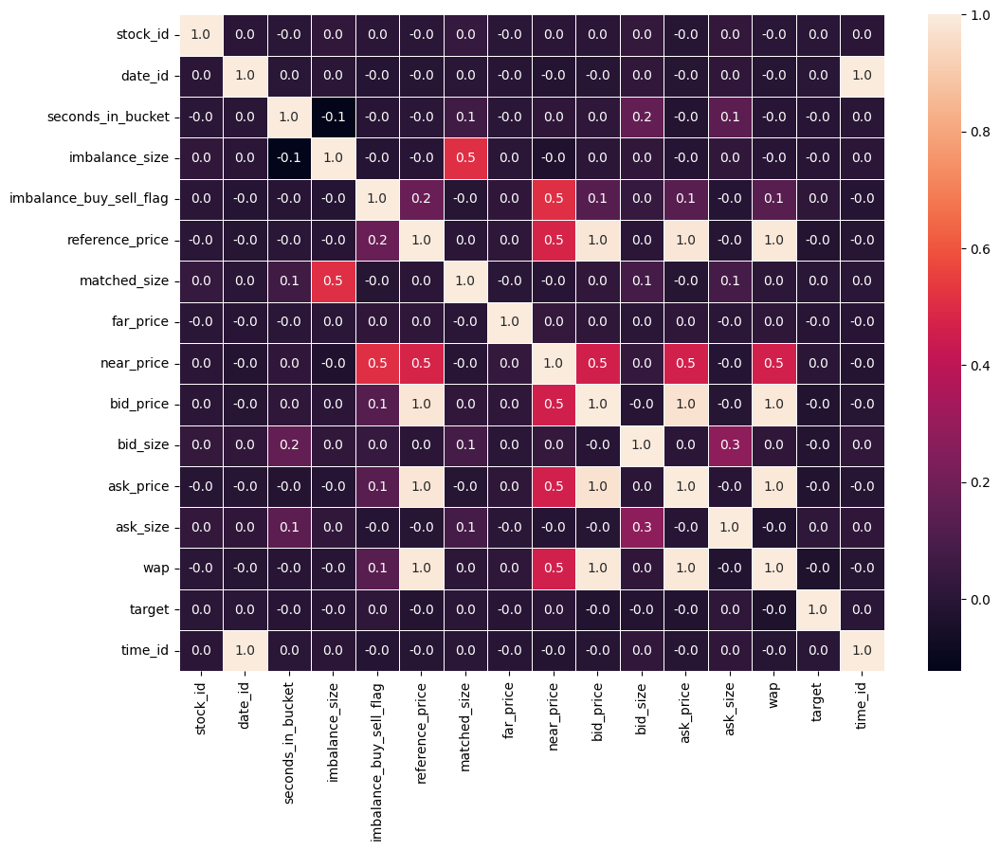

In [ ]:
f,ax = plt.subplots(figsize=(12, 9))
sns.heatmap(df.corr(),annot =True,linewidths = 0.5,fmt = '.1f',ax=ax)
plt.show()

<font color='green'>**Distribution for all data**</font> 🥸

array([[<Axes: title={'center': 'stock_id'}>,
        <Axes: title={'center': 'date_id'}>,
        <Axes: title={'center': 'seconds_in_bucket'}>,
        <Axes: title={'center': 'imbalance_size'}>],
       [<Axes: title={'center': 'imbalance_buy_sell_flag'}>,
        <Axes: title={'center': 'reference_price'}>,
        <Axes: title={'center': 'matched_size'}>,
        <Axes: title={'center': 'far_price'}>],
       [<Axes: title={'center': 'near_price'}>,
        <Axes: title={'center': 'bid_price'}>,
        <Axes: title={'center': 'bid_size'}>,
        <Axes: title={'center': 'ask_price'}>],
       [<Axes: title={'center': 'ask_size'}>,
        <Axes: title={'center': 'wap'}>,
        <Axes: title={'center': 'target'}>,
        <Axes: title={'center': 'time_id'}>]], dtype=object)

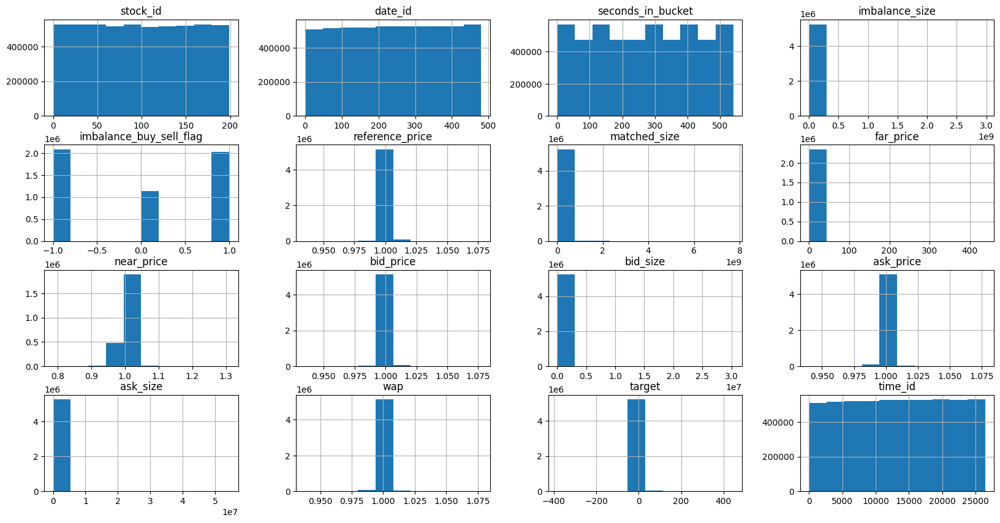

In [ ]:
df.hist(figsize=(20,10))

<font color='green'>**Distribution of imbalance buy/sell flag**</font> 🐤


<font color='green'>buy-side imbalance: 1, sell-side imbalance: -1, and no imbalance: 0</font>


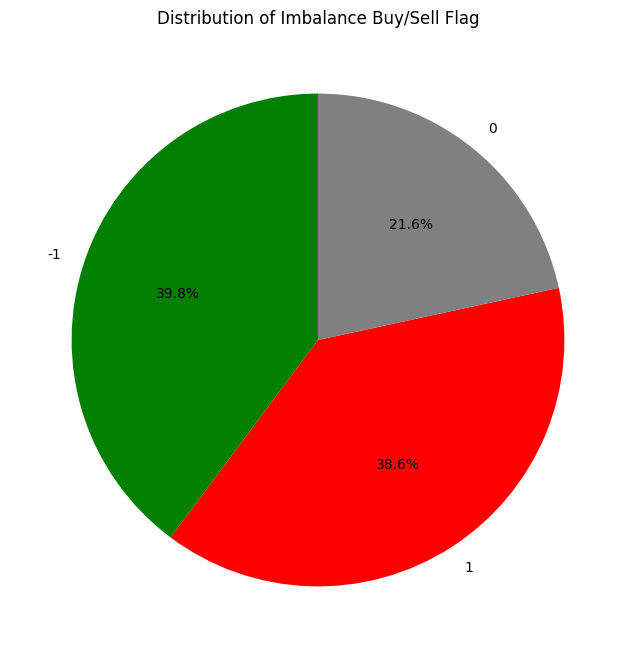

In [ ]:
imbalance_counts = df['imbalance_buy_sell_flag'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(imbalance_counts, labels=imbalance_counts.index, autopct='%1.1f%%', startangle=90, colors=['green', 'red', 'gray'])
plt.title('Distribution of Imbalance Buy/Sell Flag')
plt.show()


<font color='green'>**Reference Price Over Time**</font> ⌚


Text(0, 0.5, 'Reference Price')

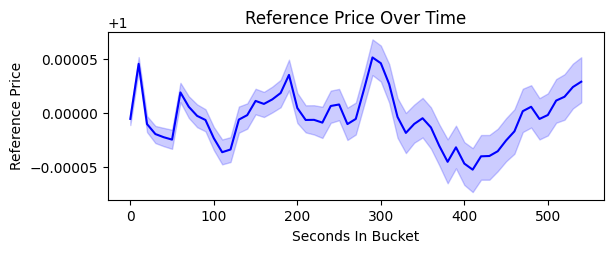

In [ ]:
plt.subplot(2, 1, 1)
sns.lineplot(x=df.seconds_in_bucket, y='reference_price', data=df, color='blue')
plt.title('Reference Price Over Time')
plt.xlabel('Seconds In Bucket')
plt.ylabel('Reference Price')


<font color='green'>**imbalance_size Over Time**</font> ⏰


Text(0, 0.5, 'Imbalance Size')

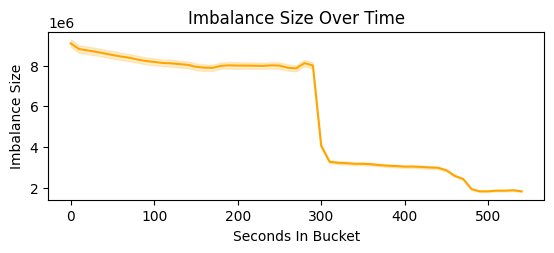

In [ ]:
plt.subplot(2, 1, 2)
sns.lineplot(x=df.seconds_in_bucket, y='imbalance_size', data=df, color='orange')
plt.title('Imbalance Size Over Time')
plt.xlabel('Seconds In Bucket')
plt.ylabel('Imbalance Size')



<font color='green'>**imbalance_size, matched_size, reference_price.. Explore pairwise relationships between these features**</font> 👽


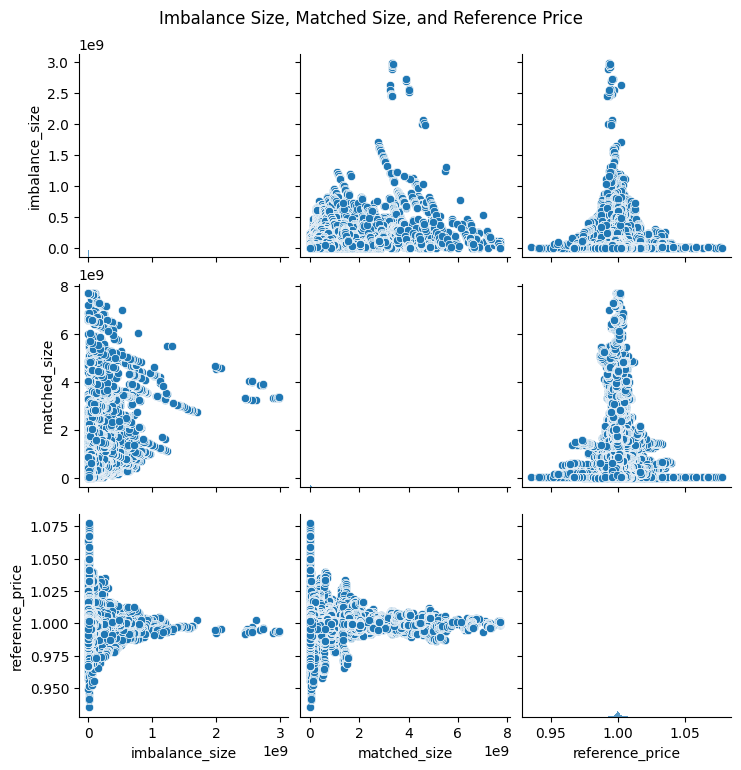

In [ ]:
pair_plot_data = df[['imbalance_size', 'matched_size', 'reference_price']]

sns.pairplot(pair_plot_data)
plt.suptitle("Imbalance Size, Matched Size, and Reference Price", y=1.02)

plt.show()



<font color='green'>**Reference_price vs. [bid/ask]_price.. regression plot to understand how the reference price is related to the bid and ask prices.**</font> ⛄



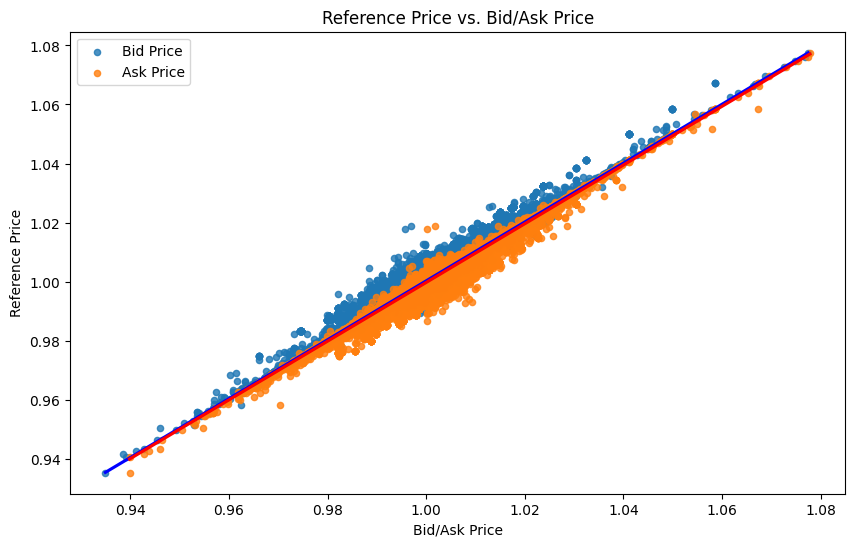

In [ ]:
plt.figure(figsize=(10, 6))

sns.regplot(x=df['bid_price'], y=df['reference_price'], data=df, scatter_kws={'s': 20}, line_kws={'color': 'blue'}, label='Bid Price')

sns.regplot(x=df['ask_price'], y=df['reference_price'], data=df, scatter_kws={'s': 20}, line_kws={'color': 'red'}, label='Ask Price')

plt.title('Reference Price vs. Bid/Ask Price')

plt.xlabel('Bid/Ask Price')
plt.ylabel('Reference Price')

plt.legend()
plt.show()


<font color='green'>**Detecting Outliers**</font> ⛄



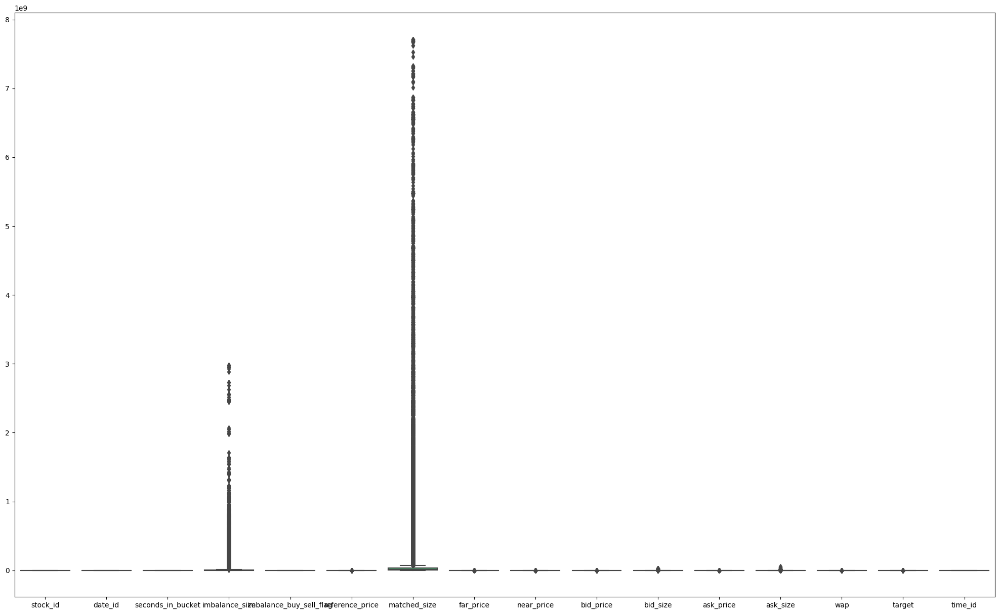

In [ ]:
plt.figure(figsize=(25, 15))
sns.boxplot(data=df)
plt.show()

###**Data Pre-processing**

**Feature Engineering**

In [ ]:
def s(x) :
  '''
  this function take the value bigger than 300 and give it number 1, else will give it number 0
  this will help us to know which data before 5 minutes which are 0 and what data after 5 minutes which are 1
  we create the condition statment bigger than 300 becaues we will apply this function on second_in_bucket column
  which has values from (0 to 540) seconds which means from (0 to 9) minutes so --> (300/60) = 5 minutes.
  '''
  if x > 300 :
      x = 1
  else:
      x = 0
  return(x)

df['3:55'] = df['seconds_in_bucket'].apply(lambda x:s(x))

In [ ]:
df1 = df #.copy()

**Data scaling**

In [ ]:
'''
in this code we standarization technique to scale specific columns in our data
Standardization centers data around a mean of zero and a standard deviation of one
because we notice the std of these features are bigger than mean so after we try some
methodes we find this method is the best for these features.
'''

prices = ["reference_price",'far_price','bid_price','ask_price']
for i in range(len(prices)) :
    mean = df1[prices[i]].mean()
    std  = df1[prices[i]].std()
    df1[prices[i]] = df1[prices[i]].apply(lambda x:(x - mean )/std )

In [ ]:
'''
in this code we scaling our data using log transformation because there is a large value range in these
features and you will notice we add 1 to x because these features contains zero values and the log(0) is -inf
so we want to avoid this values in our data.
'''

sizes = ['imbalance_size','matched_size','bid_size','ask_size']
for i in range(len(sizes)) :
    df1[sizes[i]] = df1[sizes[i]].apply(lambda x: np.log(x+1))

**Principle component analysis**

In [ ]:
'''
in this code we use PCA technique to capture information about our data and save it in 2 component then use it as columns [0, 1]
Principal component analysis, or PCA, is a dimensionality reduction method that is often used to reduce
the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still
contains most of the information in the large set
'''
# Create an instance of PCA with 2 components
pca = PCA(n_components=2)

pca_df = pca.fit_transform(df1.drop(columns = 'target' ).fillna(0))
pca_df = pd.DataFrame(pca_df)

In [ ]:
dataset_df = pca_df.join(df1, how='inner')

**Fill null values with zero in near_price and far_price**

In [ ]:
dataset_df.loc[dataset_df['seconds_in_bucket'] <= 300, "near_price"] = 0
dataset_df.loc[dataset_df['seconds_in_bucket'] <= 300, "far_price"] = 0
dataset_df

,0,1,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id,3:55
0,-1.099054e+08,-10663.717742,0,0,0,14.972582,1,-0.072473,16.409292,0.000000,0.000000,0.034293,11.012916,-0.095017,9.047119,1.000000,-3.029704,0,0_0_0,0
1,-1.099054e+08,-10663.720352,1,0,0,12.023380,-1,-0.039305,14.311557,0.000000,0.000000,0.067902,8.081487,0.157568,9.933342,1.000000,-5.519986,0,0_0_1,0
2,-1.099054e+08,-10663.722701,2,0,0,12.621095,-1,-0.171585,14.414000,0.000000,0.000000,-0.129350,10.544209,0.013348,9.851984,1.000000,-8.389950,0,0_0_2,0
3,-1.099054e+08,-10663.724806,3,0,0,16.293534,-1,0.069284,16.727304,0.000000,0.000000,0.109112,7.751862,-0.020118,13.079526,1.000000,-4.010200,0,0_0_3,0
4,-1.099054e+08,-10663.727457,4,0,0,13.011546,-1,-0.183036,16.698109,0.000000,0.000000,-0.132951,9.710300,-0.099001,6.075576,1.000000,-7.349849,0,0_0_4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5237975,3.706348e+08,4216.827486,195,480,540,14.707805,-1,0.126935,17.157678,-0.002743,0.999734,0.236346,10.381523,0.067530,12.675649,1.000328,2.310276,26454,480_540_195,1
5237976,3.706348e+08,4216.824941,196,480,540,12.764292,-1,0.255661,16.033376,-0.002195,1.000386,0.366780,12.231299,0.253184,11.444583,1.000819,-8.220077,26454,480_540_196,1
5237977,3.706348e+08,4216.821509,197,480,540,0.000000,0,-1.661024,16.359113,-0.008211,0.995789,-1.575329,9.728638,-1.745587,12.100931,0.995797,1.169443,26454,480_540_197,1
5237978,3.706348e+08,4216.820225,198,480,540,13.816410,1,-0.310183,18.366998,-0.003469,0.999210,-0.302596,11.741118,-0.420111,13.414875,0.999008,-1.540184,26454,480_540_198,1


**We drop this column from training set because it is not in the test set**

In [ ]:
dataset_df.drop(columns = 'time_id',inplace = True )
dataset_df

,0,1,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,row_id,3:55
0,-1.099054e+08,-10663.717742,0,0,0,14.972582,1,-0.072473,16.409292,0.000000,0.000000,0.034293,11.012916,-0.095017,9.047119,1.000000,-3.029704,0_0_0,0
1,-1.099054e+08,-10663.720352,1,0,0,12.023380,-1,-0.039305,14.311557,0.000000,0.000000,0.067902,8.081487,0.157568,9.933342,1.000000,-5.519986,0_0_1,0
2,-1.099054e+08,-10663.722701,2,0,0,12.621095,-1,-0.171585,14.414000,0.000000,0.000000,-0.129350,10.544209,0.013348,9.851984,1.000000,-8.389950,0_0_2,0
3,-1.099054e+08,-10663.724806,3,0,0,16.293534,-1,0.069284,16.727304,0.000000,0.000000,0.109112,7.751862,-0.020118,13.079526,1.000000,-4.010200,0_0_3,0
4,-1.099054e+08,-10663.727457,4,0,0,13.011546,-1,-0.183036,16.698109,0.000000,0.000000,-0.132951,9.710300,-0.099001,6.075576,1.000000,-7.349849,0_0_4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5237975,3.706348e+08,4216.827486,195,480,540,14.707805,-1,0.126935,17.157678,-0.002743,0.999734,0.236346,10.381523,0.067530,12.675649,1.000328,2.310276,480_540_195,1
5237976,3.706348e+08,4216.824941,196,480,540,12.764292,-1,0.255661,16.033376,-0.002195,1.000386,0.366780,12.231299,0.253184,11.444583,1.000819,-8.220077,480_540_196,1
5237977,3.706348e+08,4216.821509,197,480,540,0.000000,0,-1.661024,16.359113,-0.008211,0.995789,-1.575329,9.728638,-1.745587,12.100931,0.995797,1.169443,480_540_197,1
5237978,3.706348e+08,4216.820225,198,480,540,13.816410,1,-0.310183,18.366998,-0.003469,0.999210,-0.302596,11.741118,-0.420111,13.414875,0.999008,-1.540184,480_540_198,1


**Do the same processing for test data**

In [ ]:
def prepration(df1):
  '''
  this function combined all steps that we apply it on our training set so we can apply it on our test set
  '''

  def s(x) :
      if x > 300 :
          x = 1
      else:
          x = 0
      return(x)
  df1['3:55'] = df1['seconds_in_bucket'].apply(lambda x:s(x))

  prices = ["reference_price",'far_price','bid_price','ask_price']
  for i in range(len(prices)) :
      mean = df1[prices[i]].mean()
      std  = df1[prices[i]].std()
      df1[prices[i]] = df1[prices[i]].apply(lambda x:(x - mean )/std )

  sizes = ['imbalance_size','matched_size','bid_size','ask_size']
  for i in range(len(sizes)) :
      df1[sizes[i]] = df1[sizes[i]].apply(lambda x: np.log(x+1))


  pca = PCA(n_components=2)

  # we drop currently_scored because we drop the target and this represents the target in test data
  pca_df = pca.fit_transform(df1.drop(columns = 'currently_scored' ).fillna(0))
  pca_df = pd.DataFrame(pca_df)

  dataset_df = pca_df.join(df1, how='inner')

  dataset_df.loc[dataset_df['seconds_in_bucket'] <= 300, "near_price"] = 0
  dataset_df.loc[dataset_df['seconds_in_bucket'] <= 300, "far_price"] = 0

  dataset_df.set_index("row_id",inplace= True )




  return dataset_df

In [ ]:
test1 = prepration(test_df)
test1

,0,1,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,time_id,currently_scored,3:55
row_id,,,,,,,,,,,,,,,,,,,
478_0_0,-2.182092e+08,-226.431308,0,478,0,15.138187,-1,-0.145819,16.262107,0.000000,0.000000,-0.020897,10.040681,-0.193735,9.124630,1.000000,26290,False,0
478_0_1,-2.182092e+08,-226.514995,1,478,0,13.801389,-1,0.049911,15.163593,0.000000,0.000000,0.012762,7.585230,0.105674,9.888019,1.000000,26290,False,0
478_0_2,-2.182092e+08,-226.594163,2,478,0,13.303233,1,0.229242,15.287799,0.000000,0.000000,0.001370,8.409434,0.124693,10.461849,1.000000,26290,False,0
478_0_3,-2.182092e+08,-226.685204,3,478,0,14.870630,-1,-0.184436,17.116134,0.000000,0.000000,-0.108927,9.685521,-0.118204,9.241354,1.000000,26290,False,0
478_0_4,-2.182092e+08,-226.765603,4,478,0,13.514487,-1,-0.140000,15.999413,0.000000,0.000000,-0.101160,9.852897,-0.162762,8.888288,1.000000,26290,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480_540_195,2.622832e+08,218.400307,195,480,540,14.707805,-1,0.087999,17.157678,0.062884,0.999734,0.207982,10.381523,0.014928,12.675649,1.000328,26454,False,1
480_540_196,2.622832e+08,218.324609,196,480,540,12.764292,-1,0.260453,16.033376,0.079401,1.000386,0.376794,12.231299,0.268149,11.444583,1.000819,26454,False,1
480_540_197,2.622832e+08,218.319556,197,480,540,0.000000,0,-2.307310,16.359113,-0.102076,0.995789,-2.136735,9.728638,-2.458053,12.100931,0.995797,26454,False,1


In [ ]:
test1 .dropna(inplace =True)
dataset_df.dropna(inplace = True)

#### **Modelling Algos**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import TweedieRegressor
from sklearn.linear_model import Lasso
from sklearn.cross_decomposition import PLSRegression
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.neighbors import KNeighborsRegressor
# from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [ ]:
x = dataset_df.drop(columns=['target', 'row_id'])
x.columns = x.columns.astype(str)
y = dataset_df['target']
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.3, shuffle=False)

In [ ]:
mae_ = []
models = ['Linear Regression' ,'Ridge Regression' ,'Lasso Regression', ' Tweedie regression', 'PLSRegression','Decision Trees',
          'MLPRegressor' ,'XGBRegressor', 'CatBoost Regressor'
         ]

# 'RandomForest Regression' ,  'GradientBoosting Regression' ,'SVR rbf','SVR linear', 'SVR poly', 'KNeighbours Regression','AdaBoost Regression' --> these models didn't work

#### Linear Regression

In [ ]:
linear_reg = LinearRegression()
linear_reg.fit(X_train,y_train)
y_pred_lr = linear_reg.predict(X_test)

In [ ]:
mae_lr = mean_absolute_error(y_test, y_pred_lr)
mae_.append(mae_lr)

In [ ]:
mae_lr

6.1251235429253015

#### Ridge regression


In [ ]:
reg = Ridge()
reg.fit(X_train,y_train)
y_pred_reg=reg.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.72557e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [ ]:
mae_reg = mean_absolute_error(y_test, y_pred_reg)
mae_.append(mae_reg)

In [ ]:
mae_reg

6.128274134138237

#### Lasso Regression

In [ ]:
clf_la = Lasso()
clf_la.fit(X_train , y_train)
y_pred_la=reg.predict(X_test)

In [ ]:
mae_la = mean_absolute_error(y_test, y_pred_la)
mae_.append(mae_la)

In [ ]:
mae_la

6.128274134138237

#### Tweedie regression

In [ ]:
tweed = TweedieRegressor()
tweed.fit(X_train,y_train)
y_pred_tweed=tweed.predict(X_test)

In [ ]:
mae_tweed = mean_absolute_error(y_test, y_pred_tweed)
mae_.append(mae_tweed)

In [ ]:
mae_tweed

6.1624167711263595

#### PLSRegression


In [ ]:
pls2 = PLSRegression(n_components=2)
pls2.fit(X_train,y_train)
y_pred_pls = pls2.predict(X_test)

In [ ]:
mae_pls = mean_absolute_error(y_test, y_pred_pls)
mae_.append(mae_pls)

In [ ]:
mae_pls

6.1328062025987276

#### Decision Trees

In [ ]:
reg_dt = DecisionTreeRegressor()
reg_dt.fit(X_train,y_train)
y_pred_dt = reg_dt.predict(X_test)

In [ ]:
mae_dt = mean_absolute_error(y_test, y_pred_dt)
mae_.append(mae_dt)

In [ ]:
mae_dt

10.778842887575227

####  RandomForest Regression

In [ ]:
# reg_rf = RandomForestRegressor()
# reg_rf.fit(X_train,y_train)
# y_pred_rf = reg_rf.predict(X_test)

In [ ]:
# mae_rf = mean_absolute_error(y_test, y_pred_rf)
# mae_.append(mae_rf)

In [ ]:
# mae_rf

#### KNeighborsRegressor

In [ ]:
# reg_kn = KNeighborsRegressor(n_neighbors = 8, metric = "minkowski", p = 2)
# reg_kn.fit(X_train,y_train)
# y_pred_kn = reg_kn.predict(X_test)

In [ ]:
# mae_kn = mean_absolute_error(y_test, y_pred_kn)
# mae_.append(mae_kn)

In [ ]:
# mae_kn

#### Support Vector Machines

In [ ]:
# svm_rbf = SVR(kernel="rbf")
# svm_rbf.fit(X_train,y_train)
# y_pred_rbf = svm_rbf.predict(X_test)

In [ ]:
# mae_rbf = mean_absolute_error(y_test, y_pred_rbf)
# mae_.append(mae_rbf)

In [ ]:
# mae_rbf

In [ ]:
# svm_linear = SVR(kernel="linear")
# svm_linear.fit(X_train,y_train)
# y_pred_linear = svm_linear.predict(X_test)

In [ ]:
# mae_linear = mean_absolute_error(y_test, y_pred_linear)
# mae_.append(mae_linear)

In [ ]:
# mae_linear

In [ ]:
# svm_poly = SVR(kernel="poly")
# svm_poly.fit(X_train,y_train)
# y_pred_poly = svm_poly.predict(X_test)

In [ ]:
# mae_poly = mean_absolute_error(y_test, y_pred_poly)
# mae_.append(mae_poly)

In [ ]:
# mae_poly

#### MLPRegressor

In [ ]:
mlpreg = MLPRegressor()
mlpreg.fit(X_train,y_train)
y_pred_mlp = mlpreg.predict(X_test)

In [ ]:
mae_mlp = mean_absolute_error(y_test, y_pred_mlp)
mae_.append(mae_mlp)

In [ ]:
mae_mlp

17.234806407867953

#### AdaBoostRegressor

In [ ]:
# adaboost = AdaBoostRegressor()
# adaboost.fit(X_train , y_train)
# y_pred_ada = adaboost.predict(X_test)

In [ ]:
# mae_ada = mean_absolute_error(y_test, y_pred_ada)
# mae_.append(mae_ada)

In [ ]:
# mae_ada

#### GradientBoostingRegressor


In [ ]:
# gradboost = GradientBoostingRegressor()
# gradboost.fit(X_train , y_train)
# y_pred_grdboost = gradboost.predict(X_test)

In [ ]:
# mae_gradboost = mean_absolute_error(y_test, y_pred_grdboost)
# mae_.append(mae_gradboost)

In [ ]:
# mae_gradboost

#### XGBRegressor

In [ ]:
xgbreg=XGBRegressor()
XGB=xgbreg.fit(X_train,y_train)
y_pred_xgb=XGB.predict(X_test)

In [ ]:
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mae_.append(mae_xgb)

In [ ]:
mae_xgb

6.185201360374766

####CatBoost Regressor


In [ ]:
catboost_regressor = CatBoostRegressor(iterations=100, depth=6, learning_rate=0.1, loss_function='MAE')
catboost_regressor.fit(X_train, y_train)
y_pred_catboost = catboost_regressor.predict(X_test)

0:	learn: 6.4803135	total: 1.22s	remaining: 2m
1:	learn: 6.4718471	total: 2.02s	remaining: 1m 38s
2:	learn: 6.4649008	total: 2.81s	remaining: 1m 30s
3:	learn: 6.4591703	total: 3.55s	remaining: 1m 25s
4:	learn: 6.4543703	total: 4.34s	remaining: 1m 22s
5:	learn: 6.4501800	total: 5.09s	remaining: 1m 19s
6:	learn: 6.4461491	total: 5.86s	remaining: 1m 17s
7:	learn: 6.4432990	total: 6.63s	remaining: 1m 16s
8:	learn: 6.4407065	total: 7.41s	remaining: 1m 14s
9:	learn: 6.4381893	total: 8.56s	remaining: 1m 17s
10:	learn: 6.4362861	total: 9.69s	remaining: 1m 18s
11:	learn: 6.4344531	total: 11s	remaining: 1m 20s
12:	learn: 6.4328338	total: 11.9s	remaining: 1m 19s
13:	learn: 6.4314179	total: 12.6s	remaining: 1m 17s
14:	learn: 6.4303584	total: 13.3s	remaining: 1m 15s
15:	learn: 6.4293197	total: 14s	remaining: 1m 13s
16:	learn: 6.4283843	total: 14.8s	remaining: 1m 12s
17:	learn: 6.4272373	total: 15.5s	remaining: 1m 10s
18:	learn: 6.4263306	total: 16.3s	remaining: 1m 9s
19:	learn: 6.4253487	total: 17s

In [ ]:
mae_catboost = mean_absolute_error(y_test, y_pred_catboost)
mae_.append(mae_catboost)

In [ ]:
mae_catboost

6.09733573078957

#### Grid Search for catboost regressor model

In [ ]:
from sklearn.model_selection import  GridSearchCV

catboost_regressor = CatBoostRegressor()

# Define the parameter grid for grid search
param_grid = {
    'iterations': [100, 200],
    'depth': [4, 6, 8],
    'learning_rate': [0.05, 0.1, 0.2]
}

# Perform grid search using GridSearchCV
grid_search = GridSearchCV(catboost_regressor, param_grid, cv=3, scoring='neg_mean_absolute_error', verbose=2)
grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params = grid_search.best_params_
print(f'Best Parameters: {best_params}')

# Make predictions on the test set using the best model
best_catboost_model = grid_search.best_estimator_
catboost_predictions = best_catboost_model.predict(X_test)


Streaming output truncated to the last 5000 lines.
32:	learn: 9.6739814	total: 16.8s	remaining: 34.2s
33:	learn: 9.6726448	total: 17.3s	remaining: 33.6s
34:	learn: 9.6712004	total: 17.7s	remaining: 32.9s
35:	learn: 9.6700199	total: 18.3s	remaining: 32.5s
36:	learn: 9.6689856	total: 19s	remaining: 32.3s
37:	learn: 9.6670877	total: 19.8s	remaining: 32.2s
38:	learn: 9.6656942	total: 20.5s	remaining: 32.1s
39:	learn: 9.6633243	total: 21.3s	remaining: 32s
40:	learn: 9.6616625	total: 22.1s	remaining: 31.7s
41:	learn: 9.6603173	total: 22.5s	remaining: 31.1s
42:	learn: 9.6590341	total: 22.9s	remaining: 30.4s
43:	learn: 9.6573934	total: 23.4s	remaining: 29.8s
44:	learn: 9.6560893	total: 23.8s	remaining: 29.1s
45:	learn: 9.6551054	total: 24.3s	remaining: 28.5s
46:	learn: 9.6545374	total: 24.7s	remaining: 27.9s
47:	learn: 9.6536913	total: 25.1s	remaining: 27.2s
48:	learn: 9.6524827	total: 25.6s	remaining: 26.6s
49:	learn: 9.6508142	total: 26s	remaining: 26s
50:	learn: 9.6502244	total: 26.5s	remai

In [ ]:
grid_search.best_params_

{'depth': 8, 'iterations': 100, 'learning_rate': 0.05}

In [ ]:
mae_catboost_tuned = mean_absolute_error(y_test, catboost_predictions)
mae_catboost_tuned

6.101478588944522

###**plot the models performance**

In [ ]:
compare = pd.DataFrame({'Algorithms' : models , 'MAE' : mae_})
compare.sort_values(by='MAE' ,ascending=True)

,Algorithms,MAE
8,CatBoost Regressor,6.097336
0,Linear Regression,6.125124
1,Ridge Regression,6.128274
2,Lasso Regression,6.128274
4,PLSRegression,6.132806
3,Tweedie regression,6.162417
7,XGBRegressor,6.185201
5,Decision Trees,10.778843
6,MLPRegressor,17.234806


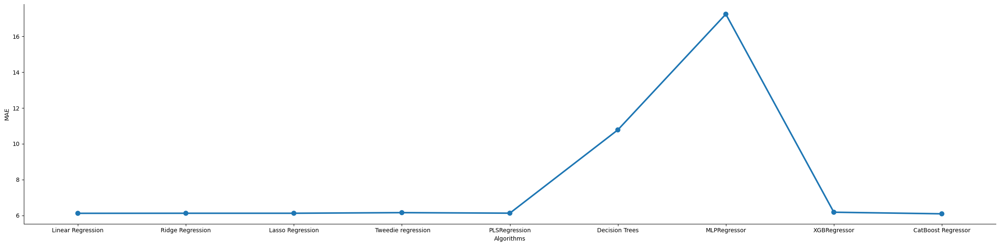

In [ ]:
sns.catplot(x='Algorithms', y='MAE', data=compare, height=6, aspect=4, kind='point')
plt.show()

####**Ensemple Learning**

In [ ]:
from sklearn.ensemble import StackingRegressor


base_regressors = [('catboost_regressor', CatBoostRegressor()),
                   ('decisionTree_regressor', DecisionTreeRegressor())]

stacking_regressor = StackingRegressor(estimators=base_regressors, final_estimator=LinearRegression())
stacking_regressor.fit(X_train, y_train)
stacking_predictions = stacking_regressor.predict(X_test)

Streaming output truncated to the last 5000 lines.
4:	learn: 9.7986287	total: 2.41s	remaining: 8m
5:	learn: 9.7933632	total: 2.91s	remaining: 8m 2s
6:	learn: 9.7884982	total: 3.36s	remaining: 7m 57s
7:	learn: 9.7832399	total: 3.86s	remaining: 7m 58s
8:	learn: 9.7801865	total: 4.34s	remaining: 7m 57s
9:	learn: 9.7767103	total: 4.79s	remaining: 7m 53s
10:	learn: 9.7743521	total: 5.23s	remaining: 7m 50s
11:	learn: 9.7713136	total: 5.68s	remaining: 7m 48s
12:	learn: 9.7694422	total: 6.2s	remaining: 7m 50s
13:	learn: 9.7672266	total: 6.61s	remaining: 7m 45s
14:	learn: 9.7646249	total: 7.11s	remaining: 7m 46s
15:	learn: 9.7627656	total: 7.57s	remaining: 7m 45s
16:	learn: 9.7609128	total: 8.05s	remaining: 7m 45s
17:	learn: 9.7584575	total: 8.49s	remaining: 7m 43s
18:	learn: 9.7557866	total: 9s	remaining: 7m 44s
19:	learn: 9.7545787	total: 9.51s	remaining: 7m 45s
20:	learn: 9.7531187	total: 10.2s	remaining: 7m 56s
21:	learn: 9.7515313	total: 11s	remaining: 8m 9s
22:	learn: 9.7498657	total: 11.

In [ ]:
mae_stacking_model = mean_absolute_error(y_test, stacking_predictions)
mae_stacking_model

6.122206609006663

####**My Method For Building Model**
**Catboost**

In [ ]:
'''
here we split our data to train set and validation set and it's important to not shuffle the data
because its time series data
'''

X = dataset_df.drop(columns = "target")
Y = dataset_df[["target","row_id"]]
X.reset_index(inplace= True )
Y.reset_index(inplace= True )
X.set_index("row_id",inplace= True )
Y.set_index("row_id",inplace= True )
X.drop(columns = "index" ,inplace = True )
Y.drop(columns = "index" ,inplace = True)

train_x,valid_x,train_labels,valid_labels = train_test_split(X,Y,test_size= 0.20,shuffle=False)

<ipython-input-16-b70fb6a3910e>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y.drop(columns = "index" ,inplace = True)


In [ ]:
'''
our model is catboost regressor and we feed it with the data as chunks based on stock_id from stock (0 to 199)
so each stock will have it's own trained model.
'''

# Fetch the unique list of user sessions in the validation dataset
VALID_USER_LIST = valid_x.index.unique()

# Create a dataframe for storing the predictions of each stock for all data
prediction_df = pd.DataFrame(data=np.zeros((len(VALID_USER_LIST), 1)), index=VALID_USER_LIST)

# Create an empty dictionary to store the models created for each stock
models = {}

# Create an empty dictionary to store the evaluation score for each stock
evaluation_dict = {}

for stock in range(0, 200):
    grp = stock
    print("### stock", stock, "grp", grp)

    # Filter the rows in the datasets based on the selected level group.
    train_df = train_x.loc[train_x.stock_id == grp]
    train_users = train_df.index.values
    valid_df = valid_x.loc[valid_x.stock_id == grp]
    valid_users = valid_df.index.values

    # Select the labels for the related stock.
    train_labels1 = train_labels.loc[train_users]
    valid_labels1 = valid_labels.loc[valid_users]


    train_data = train_df.drop(columns=['stock_id']).values
    valid_data = valid_df.drop(columns=['stock_id']).values

    # Create the CatBoostClassifier model.
    catboost_model = CatBoostRegressor(iterations = 10,learning_rate = 0.1 ,depth = 6 )

    # Train the model.
    catboost_model.fit(train_data, train_labels1)

    # Store the model.
    models[f'{grp}_{stock}'] = catboost_model

    # Evaluate the trained model on the validation dataset and store the evaluation MAE score in the `evaluation_dict`.
    predictions = models[f'{grp}_{stock}'].predict(valid_data)

    mae = mean_absolute_error(valid_labels1, predictions)

    evaluation_dict[stock] = {'mae': mae}

    prediction_df.loc[valid_users, 0] = predictions

### stock 0 grp 0
0:	learn: 6.1424699	total: 58.2ms	remaining: 524ms
1:	learn: 6.1150797	total: 64.8ms	remaining: 259ms
2:	learn: 6.0968815	total: 71.2ms	remaining: 166ms
3:	learn: 6.0768429	total: 77.8ms	remaining: 117ms
4:	learn: 6.0643733	total: 85.6ms	remaining: 85.6ms
5:	learn: 6.0524561	total: 91.9ms	remaining: 61.3ms
6:	learn: 6.0440542	total: 99.1ms	remaining: 42.5ms
7:	learn: 6.0308085	total: 106ms	remaining: 26.5ms
8:	learn: 6.0213990	total: 113ms	remaining: 12.6ms
9:	learn: 6.0073699	total: 120ms	remaining: 0us
### stock 1 grp 1
0:	learn: 11.6349485	total: 11.7ms	remaining: 105ms
1:	learn: 11.5873348	total: 19.3ms	remaining: 77.2ms
2:	learn: 11.5438056	total: 26.3ms	remaining: 61.3ms
3:	learn: 11.5088365	total: 33.5ms	remaining: 50.2ms
4:	learn: 11.4801282	total: 40.6ms	remaining: 40.6ms
5:	learn: 11.4542872	total: 47.4ms	remaining: 31.6ms
6:	learn: 11.4297277	total: 54.6ms	remaining: 23.4ms
7:	learn: 11.4065225	total: 61.5ms	remaining: 15.4ms
8:	learn: 11.3876351	total: 68.

**Model performance**

In [ ]:
# Iterate over the evaluation dictionary and print the MAE score for each stock
for stock, scores in evaluation_dict.items():
    mae = scores['mae']
    print(f"Stock {stock}: mae: {mae:.4f}")

Stock 0: mae: 4.1003
Stock 1: mae: 8.0998
Stock 2: mae: 7.1710
Stock 3: mae: 3.4720
Stock 4: mae: 3.8488
Stock 5: mae: 7.4878
Stock 6: mae: 6.0531
Stock 7: mae: 5.6435
Stock 8: mae: 5.1292
Stock 9: mae: 5.0455
Stock 10: mae: 4.5482
Stock 11: mae: 9.9548
Stock 12: mae: 4.1786
Stock 13: mae: 5.0578
Stock 14: mae: 4.4804
Stock 15: mae: 5.3582
Stock 16: mae: 6.2612
Stock 17: mae: 5.6753
Stock 18: mae: 7.8377
Stock 19: mae: 7.6731
Stock 20: mae: 5.3060
Stock 21: mae: 4.9708
Stock 22: mae: 6.3869
Stock 23: mae: 4.9702
Stock 24: mae: 4.2243
Stock 25: mae: 5.0701
Stock 26: mae: 6.1887
Stock 27: mae: 5.5626
Stock 28: mae: 5.0270
Stock 29: mae: 4.7323
Stock 30: mae: 4.6950
Stock 31: mae: 18.0625
Stock 32: mae: 4.2697
Stock 33: mae: 8.2654
Stock 34: mae: 5.3703
Stock 35: mae: 4.3034
Stock 36: mae: 5.4904
Stock 37: mae: 3.9161
Stock 38: mae: 4.3847
Stock 39: mae: 4.2839
Stock 40: mae: 6.4611
Stock 41: mae: 5.0588
Stock 42: mae: 8.7647
Stock 43: mae: 5.8423
Stock 44: mae: 4.6127
Stock 45: mae: 3.19

In [ ]:
mean_f1_score = np.mean([scores['mae'] for scores in evaluation_dict.values()])
print(f"Mean : {mean_f1_score:.4f}")

Mean : 6.0338


####**Feature importances**


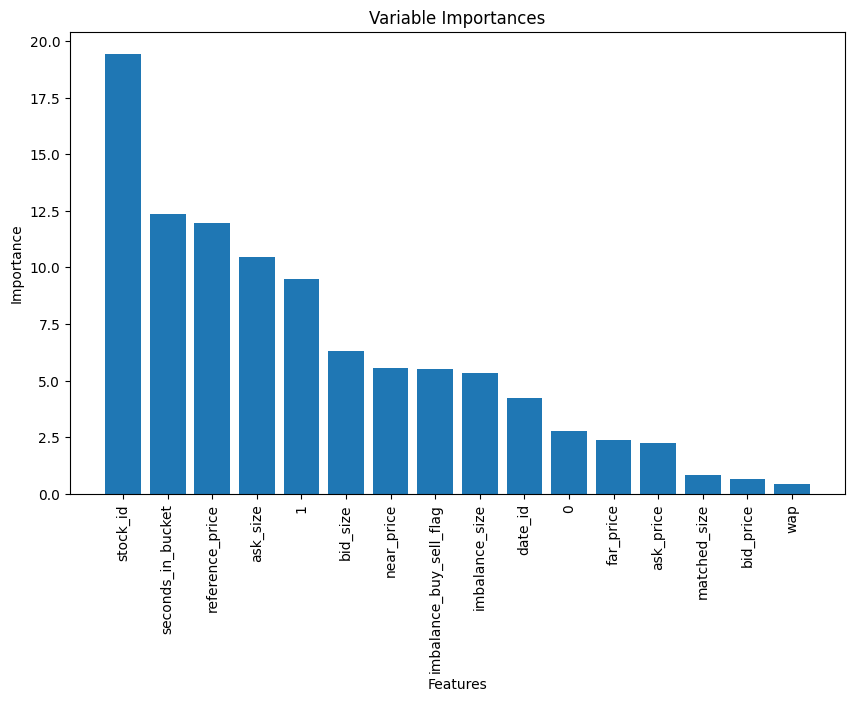

In [ ]:
# Get the feature importances from the model
feature_importances = catboost_model.feature_importances_

# Get the names of the features used in the model
feature_names = train_df.columns

# Sort the feature importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), sorted_feature_importances, tick_label=sorted_feature_names)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Variable Importances')
plt.show()

###**Submission**


In [ ]:
import optiver2023
import time

env = optiver2023.make_env()
iter_test = env.iter_test()
is_infer = True

In [ ]:
def zero_sum(prices, volumes):
    std_error = np.sqrt(volumes)
    step = np.sum(prices) / np.sum(std_error)
    out = prices - std_error * step
    return out

if is_infer:
    counter = 0
    y_min, y_max = -64, 64
    qps, predictions = [], []
    cache = pd.DataFrame()


    for (test, revealed_targets, sample_prediction) in iter_test:
        now_time = time.time()
        cache = pd.concat([cache, test], ignore_index=True, axis=0)
        if counter > 0:
            cache = cache.groupby(['stock_id']).tail(21).sort_values(by=['date_id', 'seconds_in_bucket', 'stock_id']).reset_index(drop=True)
        feat = prepration(cache)[-len(test):]
        print(f"Feat Shape is: {feat.shape}")

        test_VALID_USER_LIST = feat.index.unique()

        prediction_df_test = pd.DataFrame(data=np.zeros((len(test_VALID_USER_LIST), 1)), index=test_VALID_USER_LIST)

        for stock in range(0, 200):
            grp = stock
            valid_test = feat.loc[feat.stock_id == grp]
            valid_users = valid_test.index.values

            valid_test.drop(columns = "currently_scored",inplace = True)
            valid_data_test = valid_test.drop(columns=['stock_id']).values

            predictions_test = models[f'{grp}_{stock}'] .predict(valid_data_test)

            prediction_df_test.loc[valid_users, 0] = predictions_test

            prediction_df_test1 = np.array(prediction_df_test[0])

            final_predictions = prediction_df_test1 - np.mean(prediction_df_test1)
            clipped_predictions = np.clip(final_predictions, y_min, y_max)
            sample_prediction['target'] = clipped_predictions

        env.predict(sample_prediction)
        counter += 1
        qps.append(time.time() - now_time)
        if counter % 10 == 0:
            print(counter, 'qps:', np.mean(qps))

    time_cost = 1.146 * np.mean(qps)
    print(f"The code will take approximately {np.round(time_cost, 4)} hours to reason about")

This version of the API is not optimized and should not be used to estimate the runtime of your code on the hidden test set.
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

10 qps: 1.2086845874786376
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

20 qps: 1.2451042056083679
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

30 qps: 1.2641125440597534
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

40 qps: 1.2700966238975524
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

50 qps: 1.2786230993270875
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

60 qps: 1.2829481840133667
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

70 qps: 1.2903833627700805
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

80 qps: 1.2921041786670684
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

90 qps: 1.2969009823269315
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

100 qps: 1.2948320817947387
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

110 qps: 1.2951541597192937
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

120 qps: 1.2956239183743794
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

130 qps: 1.2955478539833656
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

140 qps: 1.2969734055655344
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

150 qps: 1.298512708346049
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

160 qps: 1.2983485281467437
Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

Feat Shape is: (200, 18)


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne

The code will take approximately 1.4873 hours to reason about


/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykernel_19/587229402.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_test.drop(columns = "currently_scored",inplace = True)
/tmp/ipykerne